<a href="https://colab.research.google.com/github/Toucanet/AI-for-CT-Toucan-Classifier/blob/main/Final_AI_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import torch
from torchvision import datasets, transforms
import torch.optim as optim
import torch.nn.functional as F
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# Imshow, Data Augmentation, Setting Dataset

In [ ]:
# imshow function for displaying images
def imshow(image, ax=None, title=None, normalize=True):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()
    image = image.numpy().transpose((1, 2, 0))

    if normalize:
        mean = np.array([0.5, 0.5, 0.5])
        std = np.array([0.5, 0.5, 0.5])
        image = std * image + mean
        image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')

    return ax

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
#!unzip '/content/gdrive/MyDrive/ToucanDatasetV2.zip' > /dev/null # has large images for test set 2, everything works apart from the heatmaps
!unzip '/content/gdrive/MyDrive/ToucanDatasetV4.zip' > /dev/null # 'bad' image heatmap attempt, has smaller test set 2 images

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
data_dir = 'ToucanDatasetV2'
batch_size = 32

transform = transforms.Compose([transforms.Resize(230),
                                transforms.RandomCrop(224),
                                transforms.ToTensor(),
                                transforms.Normalize([0.5, 0.5, 0.5],
                                                     [0.5, 0.5, 0.5])])

train_data = datasets.ImageFolder(data_dir + '/Training', transform = transform)
val_data = datasets.ImageFolder(data_dir + '/Validating', transform = transform)
test_data = datasets.ImageFolder(data_dir + '/Testing', transform = transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size, shuffle=True)

torch.Size([32])


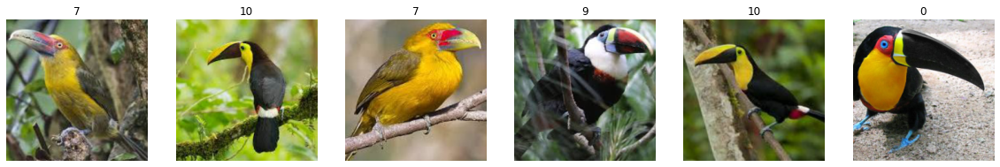

In [ ]:
data_iter = iter(train_loader)
images, labels = next(data_iter)

print(labels.shape)

fig, axes = plt.subplots(figsize=(20,4), ncols = 6)

for ii in range(6):
  ax = axes[ii]
  imshow(images[ii], ax=ax, normalize = True)
  ax.set_title(str(labels[ii].item()))

# Training

In [ ]:
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
  print('BAD, CPU')
else:
  print('GOOD, GPU')

GOOD, GPU


In [ ]:
import torch.nn as nn 
import torchvision.models as models

model = models.vgg16(pretrained=True)

#num_ftrs = model.fc.in_features
model.classifier[6] = nn.Linear(4096, 11) #11 classes
if train_on_gpu:
  model.cuda()
else:
  model.cpu()

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

In [ ]:
n_epochs = 20

valid_loss_min = np.Inf
train_losses, val_losses = [],[]

for epoch in range(n_epochs):
  train_loss = 0.0
  valid_loss = 0.0

  model.train()
  for data, target in train_loader:
    if train_on_gpu:
      data, target = data.cuda(), target.cuda()
    optimizer.zero_grad()
    output = model(data)
    loss = criterion(output, target)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()*data.size(0)

  model.eval()
  for data, target in val_loader:
    if train_on_gpu:
      data, target = data.cuda(), target.cuda()
    output = model(data)
    loss = criterion(output, target)
    valid_loss += loss.item()*data.size(0)

  train_loss = train_loss/len(train_loader.sampler)
  valid_loss = valid_loss/len(val_loader.sampler)

  train_losses.append(train_loss)
  val_losses.append(valid_loss)

  print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss {:.6f}'.format(
      epoch+1,
      train_loss,
      valid_loss))
  
  if valid_loss <= valid_loss_min:
    print('Validation loss decreased ({:.6f} --> {:.6f}). Saving model...'.format(
      valid_loss_min,
      valid_loss))
    torch.save(model.state_dict(), 'ToucanClassifierModel2.pt')
    torch.save(model.state_dict(), '/content/gdrive/MyDrive/ToucanClassifierModel3.pt')
    valid_loss_min = valid_loss
  


Epoch: 1 	Training Loss: 1.710335 	Validation Loss 0.957186
Validation loss decreased (inf --> 0.957186). Saving model...
Epoch: 2 	Training Loss: 0.433153 	Validation Loss 0.622999
Validation loss decreased (0.957186 --> 0.622999). Saving model...
Epoch: 3 	Training Loss: 0.104324 	Validation Loss 0.400249
Validation loss decreased (0.622999 --> 0.400249). Saving model...
Epoch: 4 	Training Loss: 0.033981 	Validation Loss 0.364058
Validation loss decreased (0.400249 --> 0.364058). Saving model...
Epoch: 5 	Training Loss: 0.016735 	Validation Loss 0.428776
Epoch: 6 	Training Loss: 0.039252 	Validation Loss 0.535305
Epoch: 7 	Training Loss: 0.091027 	Validation Loss 0.439004
Epoch: 8 	Training Loss: 0.014529 	Validation Loss 0.441264
Epoch: 9 	Training Loss: 0.020664 	Validation Loss 0.615964
Epoch: 10 	Training Loss: 0.037006 	Validation Loss 0.169229
Validation loss decreased (0.364058 --> 0.169229). Saving model...
Epoch: 11 	Training Loss: 0.002865 	Validation Loss 0.351017
Epoch: 1

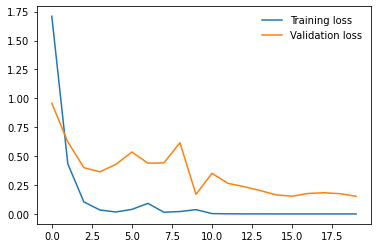

In [ ]:
plt.plot(train_losses, label = 'Training loss')
plt.plot(val_losses, label='Validation loss')
plt.legend(frameon = False)

# Testing 'good' images


In [ ]:
model.load_state_dict(torch.load('/content/gdrive/MyDrive/ToucanClassifierModel3.pt'))

<All keys matched successfully>

In [ ]:
test_loss = 0.0
class_correct = list(0. for i in range(11))
class_total = list(0. for i in range(11))

test_data = datasets.ImageFolder(data_dir + '/Testing', transform = transform)
test_loader = torch.utils.data.DataLoader(test_data, batch_size, shuffle=False)

model.eval()

for data, target in test_loader:
  if train_on_gpu:
    data, target = data.cuda(), target.cuda()
  output = model(data)
  loss = criterion(output, target)
  test_loss += loss.item()*data.size(0)
  _, pred = torch.max(output, 1)
  correct = np.squeeze(pred.eq(target.data.view_as(pred)))
  for i in range(len(target)):
    label = target.data[i]
    class_correct[label] += correct[i].item()
    class_total[label] += 1

test_loss = test_loss/len(test_loader.sampler)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(11):
  if class_total[i] > 0:
    print('Test accuracy of %5s: %2d%% {%2d / %2d)' % (
        str(i), 100* class_correct[i]/class_total[i],
        np.sum(class_correct[i]), np.sum(class_total[i])))

  else:
    print('%5s: No training examples!' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
      100. * np.sum(class_correct) / np.sum(class_total),
      np.sum(class_correct), np.sum(class_total)))

Test Loss: 0.100118

Test accuracy of     0: 100% {15 / 15)
Test accuracy of     1: 100% {15 / 15)
Test accuracy of     2: 100% {15 / 15)
Test accuracy of     3: 100% {15 / 15)
Test accuracy of     4: 100% {15 / 15)
Test accuracy of     5: 100% {15 / 15)
Test accuracy of     6: 93% {14 / 15)
Test accuracy of     7: 100% {15 / 15)
Test accuracy of     8: 100% {15 / 15)
Test accuracy of     9: 93% {14 / 15)
Test accuracy of    10: 93% {14 / 15)

Test Accuracy (Overall): 98% (162/165)


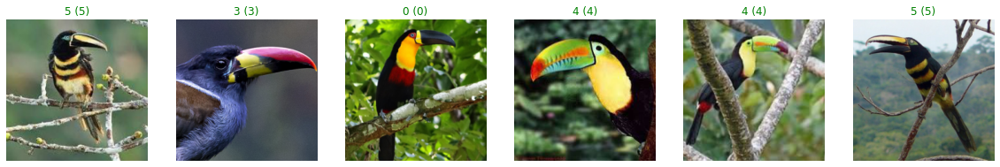

In [ ]:

test_loader = torch.utils.data.DataLoader(test_data, 100, shuffle=True)

dataiter = iter(test_loader)
images, labels = dataiter.next()
images.numpy()

if train_on_gpu:
  images = images.cpu()
  model.cpu()

output = model(images)
_, preds = torch.max(output, 1)

fig, axes = plt.subplots(figsize=(20,4), ncols=6)
for ii in range(6):
  ax = axes[ii]
  imshow(images.cpu()[ii], ax=ax, normalize=True)
  ax.set_title("{} ({})".format(str(preds[ii].item()), str(labels[ii].item())),
               color = ("green" if preds[ii]==labels[ii] else "red"))

In [ ]:
torch.cuda.empty_cache()


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


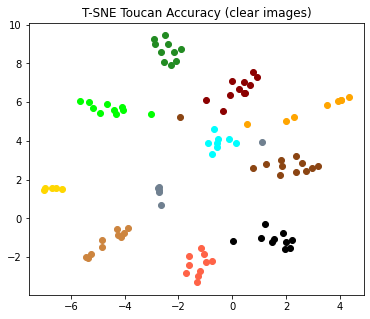

In [ ]:
from sklearn.manifold import TSNE

output = np.squeeze(output.cpu().detach().numpy())
labels = labels.numpy()

tsne = TSNE(n_components=2, random_state = 0)

toucan_X_2d = tsne.fit_transform(output)

plt.figure(figsize=(6,5))
for i in range(toucan_X_2d.shape[0]):
  if labels[i] == 0:
    #Channel Bill
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'darkred')
  if labels[i] == 1:
    #Collared
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'tomato')
  if labels[i] == 2:
    #Green Billed
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'forestgreen')
  if labels[i] == 3:
    #Gray-breasted
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'peru')
  if labels[i] == 4:
    #Keel Billed
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'lime')
  if labels[i] == 5:
    #Many-Banded
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'black')
  if labels[i] == 6:
    #Plate-Billed
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'slategrey')
  if labels[i] == 7:
    #Saffron
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'gold')
  if labels[i] == 8:
    #Toco
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'orange')
  if labels[i] == 9:
    #White Throated
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'cyan')
  if labels[i] == 10:
    #Yellow Throated
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'saddlebrown')
plt.title('T-SNE Toucan Accuracy (clear images)')
plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


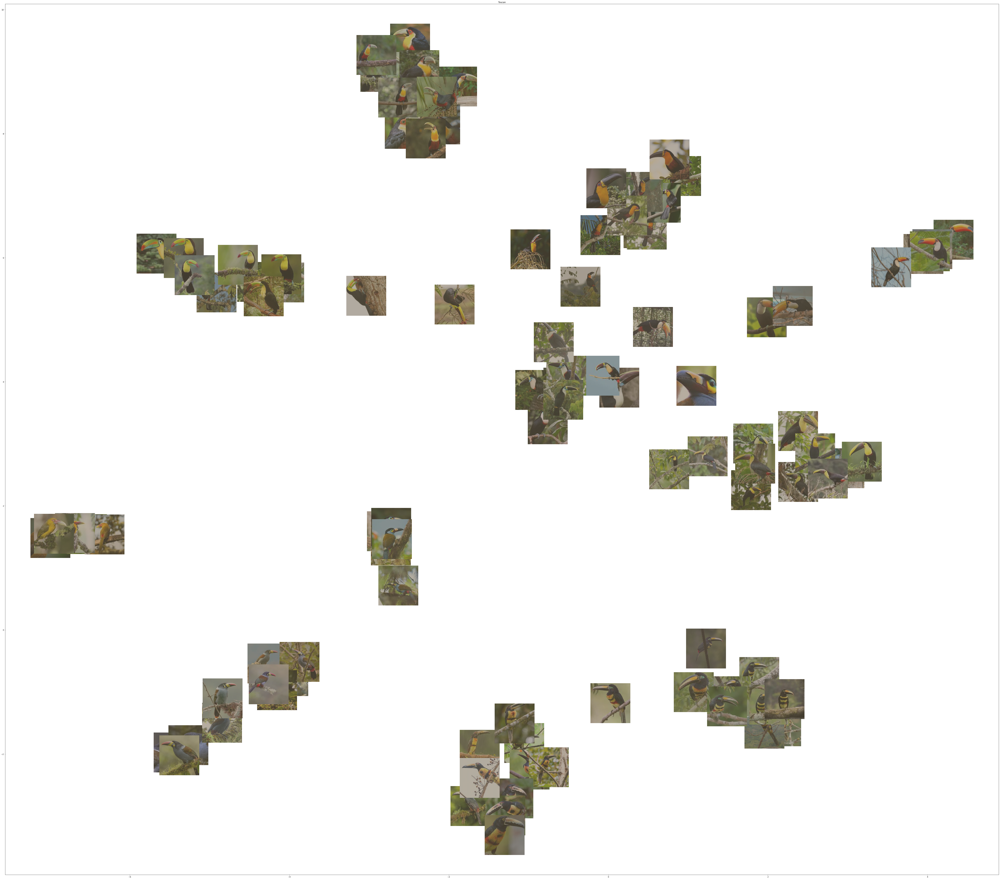

In [ ]:
tsne = TSNE(n_components=2, random_state = 0)

toucan_X_2d = tsne.fit_transform(output)

#resize images???

fig, ax = plt.subplots(figsize=(100,90))

#plt.figure(figsize=(10,9))
for i in range(toucan_X_2d.shape[0]):
  images.cpu().numpy()
  im = images[i]
  #print (im)
  im = im.cpu().numpy().transpose((1,2,0))
  mean = np.array([0.485, 0.456, 0.406])
  std = np.array([0.229, 0.224, 0.225])
  im = std * im + mean
  im = np.clip(im, 0, 1)
  ax.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1])
  ab = AnnotationBbox(OffsetImage(im), (toucan_X_2d[i,0], toucan_X_2d[i, 1]), frameon=False)
  ax.add_artist(ab)
plt.title('Toucan')
plt.show()

# Testing 'bad' images

In [ ]:
model.load_state_dict(torch.load('/content/gdrive/MyDrive/ToucanClassifierModel3.pt'))

<All keys matched successfully>

In [ ]:
test_loss = 0.0
class_correct = list(0. for i in range(11))
class_total = list(0. for i in range(11))

test_data = datasets.ImageFolder(data_dir + '/Testing2', transform = transform)
test_loader = torch.utils.data.DataLoader(test_data, batch_size, shuffle=True)

if train_on_gpu:
  images = images.cuda()
  model.cuda()

model.eval()

for data, target in test_loader:
  if train_on_gpu:
    data, target = data.cuda(), target.cuda()
  output = model(data)
  loss = criterion(output, target)
  test_loss += loss.item()*data.size(0)
  _, pred = torch.max(output, 1)
  correct = np.squeeze(pred.eq(target.data.view_as(pred)))
  for i in range(len(target)):
    label = target.data[i]
    class_correct[label] += correct[i].item()
    class_total[label] += 1

test_loss = test_loss/len(test_loader.sampler)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(11):
  if class_total[i] > 0:
    print('Test accuracy of %5s: %2d%% {%2d / %2d)' % (
        str(i), 100* class_correct[i]/class_total[i],
        np.sum(class_correct[i]), np.sum(class_total[i])))

  else:
    print('%5s: No training examples!' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
      100. * np.sum(class_correct) / np.sum(class_total),
      np.sum(class_correct), np.sum(class_total)))

Test Loss: 2.312773

Test accuracy of     0: 93% {14 / 15)
Test accuracy of     1: 20% { 3 / 15)
Test accuracy of     2: 20% { 3 / 15)
Test accuracy of     3: 73% {11 / 15)
Test accuracy of     4: 20% { 3 / 15)
Test accuracy of     5: 66% {10 / 15)
Test accuracy of     6: 40% { 6 / 15)
Test accuracy of     7: 13% { 2 / 15)
Test accuracy of     8: 33% { 5 / 15)
Test accuracy of     9: 60% { 9 / 15)
Test accuracy of    10: 40% { 6 / 15)

Test Accuracy (Overall): 43% (72/165)


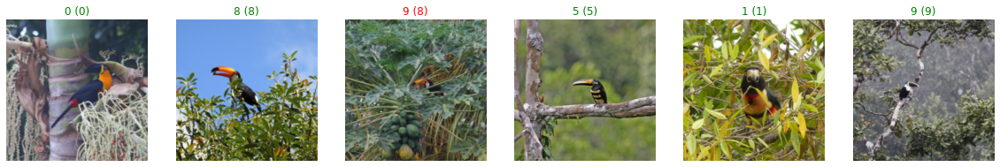

In [ ]:

test_loader = torch.utils.data.DataLoader(test_data, 100, shuffle=True)

dataiter = iter(test_loader)
images, labels = dataiter.next()
images.numpy()

if train_on_gpu:
  images = images.cpu()
  model.cpu()

output = model(images)
_, preds = torch.max(output, 1)

fig, axes = plt.subplots(figsize=(20,4), ncols=6)
for ii in range(6):
  ax = axes[ii]
  imshow(images.cpu()[ii], ax=ax, normalize=True)
  ax.set_title("{} ({})".format(str(preds[ii].item()), str(labels[ii].item())),
               color = ("green" if preds[ii]==labels[ii] else "red"))

In [ ]:
torch.cuda.empty_cache()


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


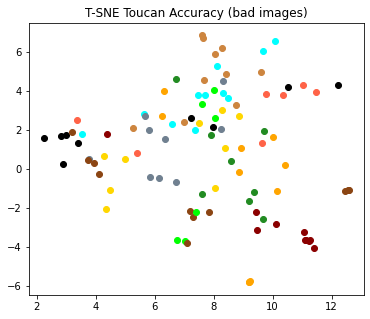

In [ ]:
from sklearn.manifold import TSNE

output = np.squeeze(output.cpu().detach().numpy())
labels = labels.numpy()

tsne = TSNE(n_components=2, random_state = 0)

toucan_X_2d = tsne.fit_transform(output)

plt.figure(figsize=(6,5))
for i in range(toucan_X_2d.shape[0]):
  if labels[i] == 0:
    #Channel Bill
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'darkred')
  if labels[i] == 1:
    #Collared
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'tomato')
  if labels[i] == 2:
    #Green Billed
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'forestgreen')
  if labels[i] == 3:
    #Gray-breasted
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'peru')
  if labels[i] == 4:
    #Keel Billed
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'lime')
  if labels[i] == 5:
    #Many-Banded
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'black')
  if labels[i] == 6:
    #Plate-Billed
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'slategrey')
  if labels[i] == 7:
    #Saffron
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'gold')
  if labels[i] == 8:
    #Toco
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'orange')
  if labels[i] == 9:
    #White Throated
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'cyan')
  if labels[i] == 10:
    #Yellow Throated
    plt.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1], c = 'saddlebrown')
plt.title('T-SNE Toucan Accuracy (bad images)')
plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


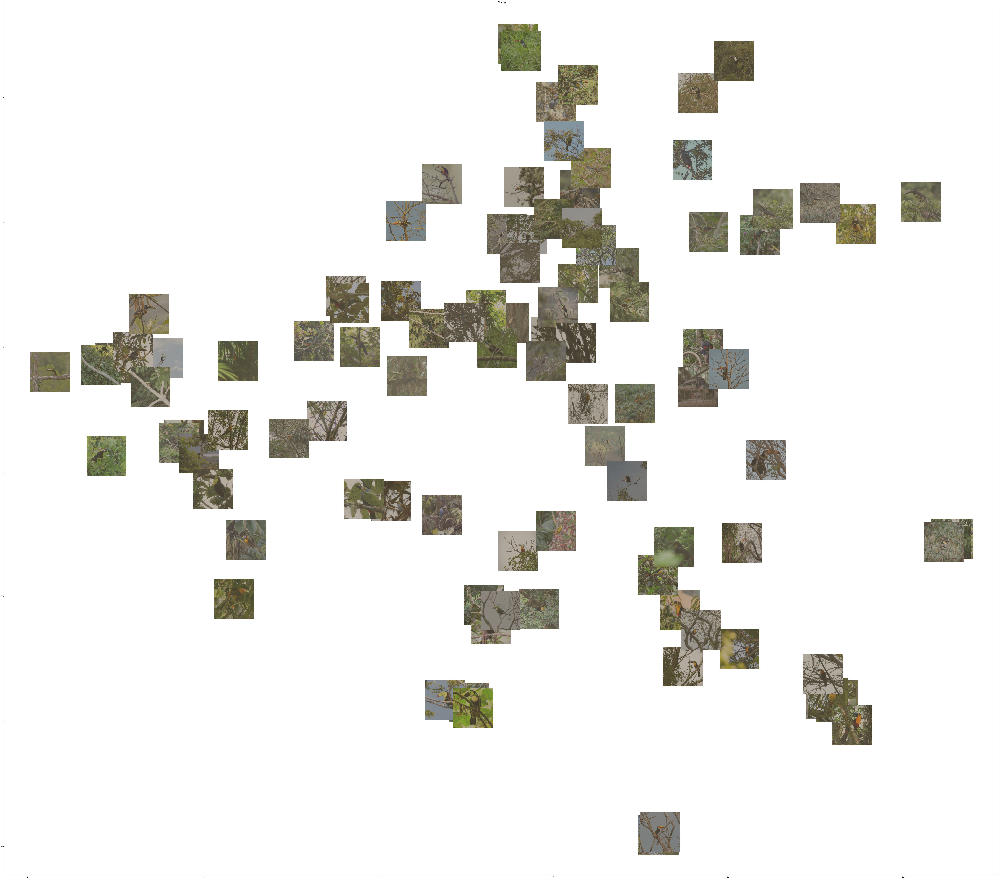

In [ ]:
tsne = TSNE(n_components=2, random_state = 0)

toucan_X_2d = tsne.fit_transform(output)

#resize images???

fig, ax = plt.subplots(figsize=(100,90))

#plt.figure(figsize=(10,9))
for i in range(toucan_X_2d.shape[0]):
  images.cpu().numpy()
  im = images[i]
  #print (im)
  im = im.cpu().numpy().transpose((1,2,0))
  mean = np.array([0.485, 0.456, 0.406])
  std = np.array([0.229, 0.224, 0.225])
  im = std * im + mean
  im = np.clip(im, 0, 1)
  ax.scatter(toucan_X_2d[i,0], toucan_X_2d[i, 1])
  ab = AnnotationBbox(OffsetImage(im), (toucan_X_2d[i,0], toucan_X_2d[i, 1]), frameon=False)
  ax.add_artist(ab)
plt.title('Toucan')
plt.show()

# Heatmaps


In [ ]:
!git clone https://github.com/yiskw713/SmoothGradCAMplusplus.git

Cloning into 'SmoothGradCAMplusplus'...
remote: Enumerating objects: 47, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 47 (delta 13), reused 24 (delta 11), pack-reused 20
Unpacking objects: 100% (47/47), done.


In [ ]:
%cd /content/SmoothGradCAMplusplus

/content/SmoothGradCAMplusplus


In [ ]:
import cam

In [ ]:
%matplotlib inline

import numpy as np
import skimage.transform
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torch.autograd import Variable


from PIL import Image
from matplotlib.pyplot import imshow
from torchvision import models, transforms
from torchvision.utils import save_image

from cam import CAM, GradCAM, GradCAMpp, SmoothGradCAMpp
from utils.visualize import visualize, reverse_normalize
from utils.imagenet_labels import label2idx, idx2label

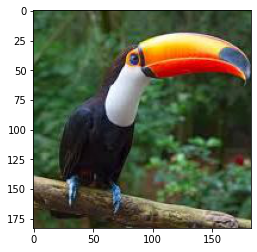

In [ ]:
image = Image.open('/content/ToucanDatasetV2/Testing/Toco/img386.jpg')
imshow(image)

In [ ]:
normalize = transforms.Normalize(mean = [0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
preprocess = transforms.Compose([transforms.ToTensor(), normalize])

In [ ]:
tensor = preprocess(image)
tensor = tensor.unsqueeze(0)

In [ ]:
model = models.vgg16(pretrained=True)
model.classifier[6] = nn.Linear(4096, 11) #11 classes
#model.fc = nn.Linear(numftrs, 5)
model.load_state_dict(torch.load('/content/gdrive/MyDrive/ToucanClassifierModel3.pt'))
model.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
target_layer = model.features[28]
wrapped_model = SmoothGradCAMpp(model, target_layer, n_samples=25, stdev_spread=0.15)

In [ ]:
cam, idx = wrapped_model(tensor)

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:1025: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


predicted class ids 8	 probability 1.0


In [ ]:
if idx == 0:
  #Channel Bill
  print('Channel Billed')
if idx == 1:
  #Collared
  print('Collared')
if idx == 2:
  #Green Billed
  print('Green Billed')
if idx == 3:
  #Gray-breasted
  print('Gray Breasted')
if idx == 4:
  #Keel Billed
  print('Keel Billed')
if idx == 5:
  #Many-Banded
  print('Many Banded')
if idx == 6:
  #Plate-Billed
  print('Plate Billed')
if idx == 7:
  #Saffron
  print('Saffron')
if idx == 8:
  #Toco
  print('Toco')
if idx == 9:
  #White Throated
  print('White Throated')
if idx == 10:
  #Yellow Throated
  print('Yellow Throated')

Toco


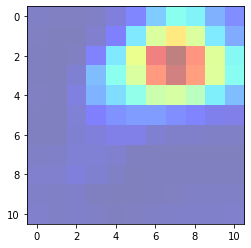

In [ ]:
imshow(cam.squeeze().numpy(), alpha=0.5, cmap='jet')

In [ ]:
img = reverse_normalize(tensor)

In [ ]:
heatmap = visualize(img, cam)

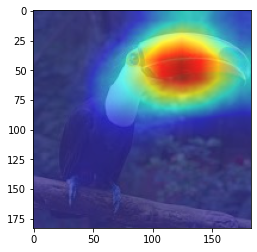

In [ ]:
hm = (heatmap.squeeze().numpy().transpose(1, 2, 0))
imshow(hm)

# Heatmaps (clone)


In [ ]:
!git clone https://github.com/yiskw713/SmoothGradCAMplusplus.git

fatal: destination path 'SmoothGradCAMplusplus' already exists and is not an empty directory.


In [ ]:
%cd /content/SmoothGradCAMplusplus

/content/SmoothGradCAMplusplus


In [ ]:
import cam

In [ ]:
%matplotlib inline

import numpy as np
import skimage.transform
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torch.autograd import Variable


from PIL import Image
from matplotlib.pyplot import imshow
from torchvision import models, transforms
from torchvision.utils import save_image

from cam import CAM, GradCAM, GradCAMpp, SmoothGradCAMpp
from utils.visualize import visualize, reverse_normalize
from utils.imagenet_labels import label2idx, idx2label

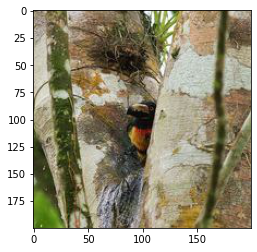

In [ ]:
image = Image.open('/content/ToucanDatasetV4/Testing2/Collared/img2.jpg')
imshow(image)

In [ ]:
normalize = transforms.Normalize(mean = [0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
preprocess = transforms.Compose([transforms.ToTensor(), normalize])

In [ ]:
tensor = preprocess(image)
tensor = tensor.unsqueeze(0)

In [ ]:
model = models.vgg16(pretrained=True)
model.classifier[6] = nn.Linear(4096, 11) #11 classes
#model.fc = nn.Linear(numftrs, 5)
model.load_state_dict(torch.load('/content/gdrive/MyDrive/ToucanClassifierModel3.pt'))
model.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
target_layer = model.features[28]
wrapped_model = SmoothGradCAMpp(model, target_layer, n_samples=25, stdev_spread=0.15)

In [ ]:
cam, idx = wrapped_model(tensor)

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:1025: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


predicted class ids 3	 probability 0.7745452523231506


In [ ]:
if idx == 0:
  #Channel Bill
  print('Channel Billed')
if idx == 1:
  #Collared
  print('Collared')
if idx == 2:
  #Green Billed
  print('Green Billed')
if idx == 3:
  #Gray-breasted
  print('Gray Breasted')
if idx == 4:
  #Keel Billed
  print('Keel Billed')
if idx == 5:
  #Many-Banded
  print('Many Banded')
if idx == 6:
  #Plate-Billed
  print('Plate Billed')
if idx == 7:
  #Saffron
  print('Saffron')
if idx == 8:
  #Toco
  print('Toco')
if idx == 9:
  #White Throated
  print('White Throated')
if idx == 10:
  #Yellow Throated
  print('Yellow Throated')

Gray Breasted


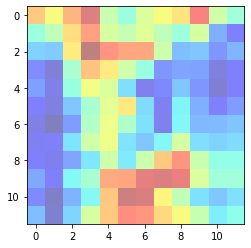

In [ ]:
imshow(cam.squeeze().numpy(), alpha=0.5, cmap='jet')

In [ ]:
img = reverse_normalize(tensor)

In [ ]:
heatmap = visualize(img, cam)

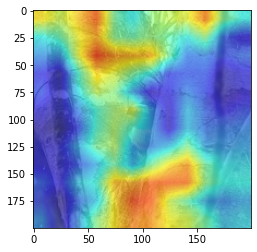

In [ ]:
hm = (heatmap.squeeze().numpy().transpose(1, 2, 0))
imshow(hm)